In [1]:
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go


In [2]:
df= pd.read_csv("accdata.csv")

In [4]:
df.head()

,Date,Time,accel_x,accel_y,accel_z
0,2022-09-03,23:35:16,-1.838747,3.543418,9.126697
1,2022-09-03,23:35:31,1.110910,1.810017,9.634268
2,2022-09-03,23:35:47,8.829816,0.833182,4.663905
3,2022-09-03,23:36:52,-0.852336,-0.124498,9.787497
4,2022-09-03,23:37:44,-0.900220,-0.095768,9.835381


## lets start by visualizing a line plot with time on the x-axis and accelerometer data on the y-axis

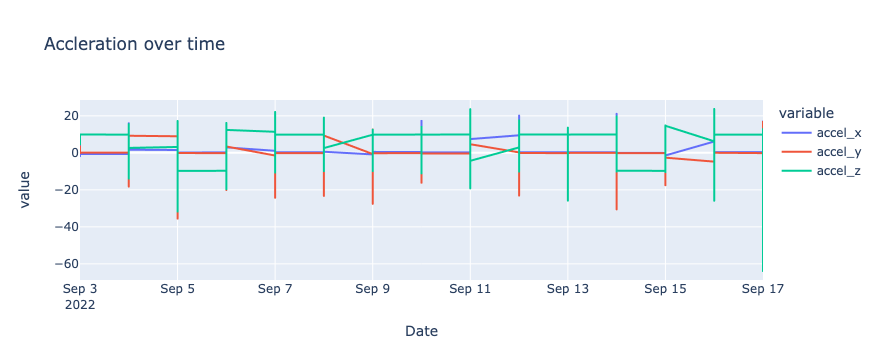

In [6]:
lineplot= px.line(df, x="Date",y=["accel_x", "accel_y", "accel_z"], title="Accleration over time")
lineplot.show()

Now let’s have a look at the average acceleration values by the hour of day and day of the week, which can help us identify any patterns or trends in the data:

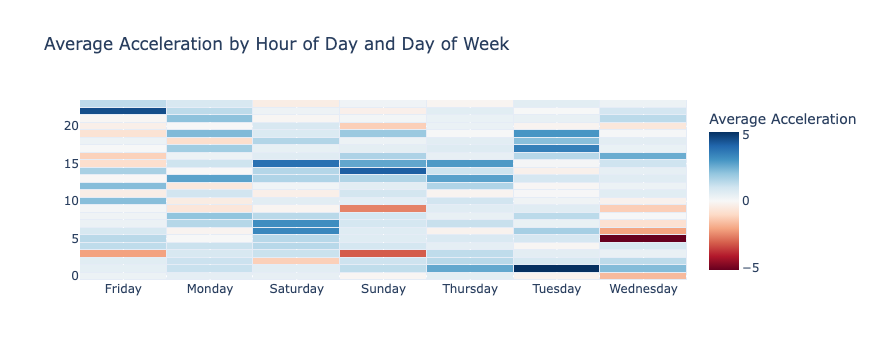

In [7]:
df["hour"] = pd.to_datetime(df["Time"]).dt.hour
df["day_of_week"] = pd.to_datetime(df["Date"]).dt.day_name()
agg_data = df.pivot_table(index="hour", columns="day_of_week", 
                            values=["accel_x", "accel_y", "accel_z"], 
                            aggfunc="mean")

# Create a heatmap
fig = go.Figure(go.Heatmap(x=agg_data.columns.levels[1], 
                           y=agg_data.index, 
                           z=agg_data.values,
                           xgap=1, ygap=1, 
                           colorscale="RdBu", 
                           colorbar=dict(title="Average Acceleration")))
fig.update_layout(title="Average Acceleration by Hour of Day and Day of Week")
fig.show()

### scatter plot of the magnitude of acceleration over time:

In [14]:
df['accel_mag'] = (df['accel_x'] ** 2 + df['accel_y'] ** 2 + df['accel_z'] ** 2) ** 0.5
#created a new feature to represent the magnitude of the acceleration vector:

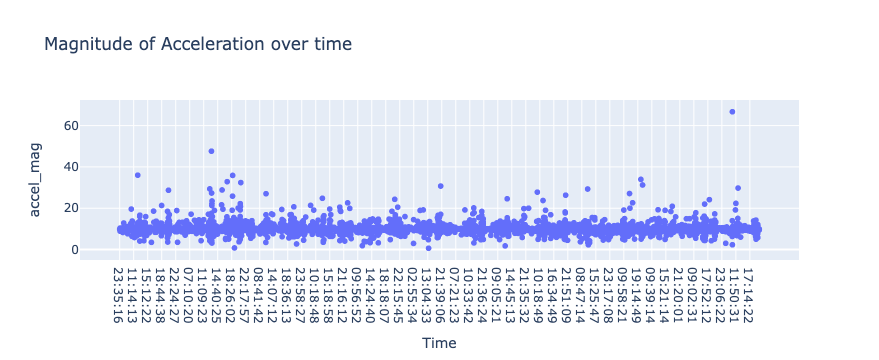

In [15]:
fig = px.scatter(df, x='Time', 
                 y='accel_mag', 
                 title='Magnitude of Acceleration over time')
fig.show()

### histogram to visualize the distribution of the magnitude of acceleration:

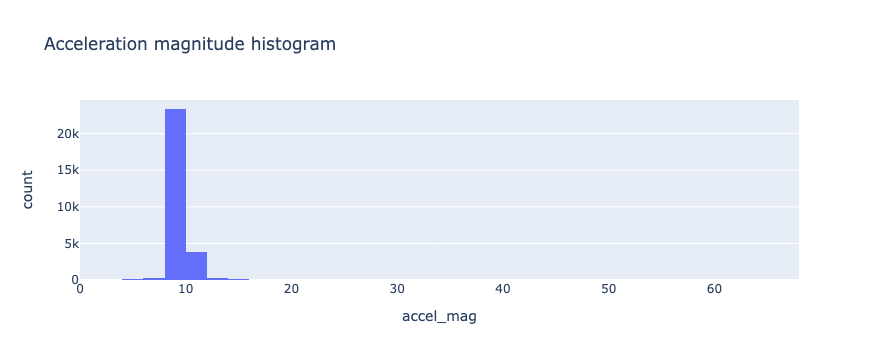

In [16]:
fig = px.histogram(df, 
                   x='accel_mag', 
                   nbins=50, title='Acceleration magnitude histogram')
fig.show()

### Summary


Accelerometer is a device used to measure the acceleration or vibrations of a motion. The data provided by an accelerometer is three-dimensional and can be used in data-driven applications for solving problems like fall detection and health monitoring. I hope you liked this article on Accelerometer Data Analysis using Python. Feel free to ask valuable questions in the comments section below.

